In [1]:
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import OneHotEncoder
DATA = pd.read_csv('musics.csv')
print(DATA.columns)




Index(['artist', 'song', 'duration_ms', 'explicit', 'year', 'popularity',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'genre'],
      dtype='object')


In [2]:
DATA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist            2000 non-null   object 
 1   song              2000 non-null   object 
 2   duration_ms       2000 non-null   int64  
 3   explicit          2000 non-null   bool   
 4   year              2000 non-null   int64  
 5   popularity        2000 non-null   int64  
 6   danceability      2000 non-null   float64
 7   energy            2000 non-null   float64
 8   key               2000 non-null   int64  
 9   loudness          2000 non-null   float64
 10  mode              2000 non-null   int64  
 11  speechiness       2000 non-null   float64
 12  acousticness      2000 non-null   float64
 13  instrumentalness  2000 non-null   float64
 14  liveness          2000 non-null   float64
 15  valence           2000 non-null   float64
 16  tempo             2000 non-null   float64


In [3]:
DATA.isna().sum()

artist              0
song                0
duration_ms         0
explicit            0
year                0
popularity          0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
genre               0
dtype: int64

In [4]:
df = DATA.drop(['song', 'year', 'artist'], axis=1) 
bins = [-10, 20, 40, 60, 80, 100]
labels = [1, 2, 3, 4, 5]
df['popularity'] = pd.cut(df['popularity'], bins=bins, labels=labels)
df.head(10)


,duration_ms,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,211160,False,4,0.751,0.834,1,-5.444,0,0.0437,0.30000,0.000018,0.3550,0.894,95.053,pop
1,167066,False,4,0.434,0.897,0,-4.918,1,0.0488,0.01030,0.000000,0.6120,0.684,148.726,"rock, pop"
2,250546,False,4,0.529,0.496,7,-9.007,1,0.0290,0.17300,0.000000,0.2510,0.278,136.859,"pop, country"
3,224493,False,4,0.551,0.913,0,-4.063,0,0.0466,0.02630,0.000013,0.3470,0.544,119.992,"rock, metal"
4,200560,False,4,0.614,0.928,8,-4.806,0,0.0516,0.04080,0.001040,0.0845,0.879,172.656,pop
5,253733,True,4,0.706,0.888,2,-6.959,1,0.0654,0.11900,0.000096,0.0700,0.714,121.549,"hip hop, pop, R&B"
6,284200,True,5,0.949,0.661,5,-4.244,0,0.0572,0.03020,0.000000,0.0454,0.760,104.504,hip hop
7,258560,False,4,0.708,0.772,7,-4.264,1,0.0322,0.02670,0.000000,0.4670,0.861,103.035,"pop, rock"
8,271333,False,4,0.713,0.678,5,-3.525,0,0.1020,0.27300,0.000000,0.1490,0.734,138.009,"pop, R&B"
9,307153,False,4,0.720,0.808,6,-5.627,1,0.0379,0.00793,0.029300,0.0634,0.869,126.041,Dance/Electronic


In [5]:
df.isna().sum()

duration_ms         0
explicit            0
popularity          0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
genre               0
dtype: int64

In [6]:
df['explicit'] = df['explicit'].replace({False: 0, True: 1})
df.head(10)

,duration_ms,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,211160,0,4,0.751,0.834,1,-5.444,0,0.0437,0.30000,0.000018,0.3550,0.894,95.053,pop
1,167066,0,4,0.434,0.897,0,-4.918,1,0.0488,0.01030,0.000000,0.6120,0.684,148.726,"rock, pop"
2,250546,0,4,0.529,0.496,7,-9.007,1,0.0290,0.17300,0.000000,0.2510,0.278,136.859,"pop, country"
3,224493,0,4,0.551,0.913,0,-4.063,0,0.0466,0.02630,0.000013,0.3470,0.544,119.992,"rock, metal"
4,200560,0,4,0.614,0.928,8,-4.806,0,0.0516,0.04080,0.001040,0.0845,0.879,172.656,pop
5,253733,1,4,0.706,0.888,2,-6.959,1,0.0654,0.11900,0.000096,0.0700,0.714,121.549,"hip hop, pop, R&B"
6,284200,1,5,0.949,0.661,5,-4.244,0,0.0572,0.03020,0.000000,0.0454,0.760,104.504,hip hop
7,258560,0,4,0.708,0.772,7,-4.264,1,0.0322,0.02670,0.000000,0.4670,0.861,103.035,"pop, rock"
8,271333,0,4,0.713,0.678,5,-3.525,0,0.1020,0.27300,0.000000,0.1490,0.734,138.009,"pop, R&B"
9,307153,0,4,0.720,0.808,6,-5.627,1,0.0379,0.00793,0.029300,0.0634,0.869,126.041,Dance/Electronic


In [7]:
df = df[df['genre'] != 'set()']
df

,duration_ms,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,211160,0,4,0.751,0.834,1,-5.444,0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop
1,167066,0,4,0.434,0.897,0,-4.918,1,0.0488,0.0103,0.000000,0.6120,0.684,148.726,"rock, pop"
2,250546,0,4,0.529,0.496,7,-9.007,1,0.0290,0.1730,0.000000,0.2510,0.278,136.859,"pop, country"
3,224493,0,4,0.551,0.913,0,-4.063,0,0.0466,0.0263,0.000013,0.3470,0.544,119.992,"rock, metal"
4,200560,0,4,0.614,0.928,8,-4.806,0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,181026,0,4,0.842,0.734,1,-5.065,0,0.0588,0.0427,0.000000,0.1060,0.952,137.958,pop
1996,178426,0,4,0.552,0.702,9,-5.707,1,0.1570,0.1170,0.000021,0.1050,0.564,169.994,pop
1997,200593,0,4,0.847,0.678,9,-8.635,1,0.1090,0.0669,0.000000,0.2740,0.811,97.984,"hip hop, country"
1998,171029,0,4,0.741,0.520,8,-7.513,1,0.0656,0.4500,0.000002,0.2220,0.347,102.998,pop


In [8]:
data = df.copy()

In [9]:


all_genres = set()
for genres in data['genre']:
    genres_list = [genre.strip() for genre in genres.split(',')]
    all_genres.update(genres_list)
for genre in all_genres:
    data[genre] = data['genre'].apply(lambda x: 1 if genre in [g.strip() for g in x.split(',')] else 0)
data

,duration_ms,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,...,pop,country,Folk/Acoustic,classical,jazz,rock,World/Traditional,blues,R&B,hip hop
0,211160,0,4,0.751,0.834,1,-5.444,0,0.0437,0.3000,...,1,0,0,0,0,0,0,0,0,0
1,167066,0,4,0.434,0.897,0,-4.918,1,0.0488,0.0103,...,1,0,0,0,0,1,0,0,0,0
2,250546,0,4,0.529,0.496,7,-9.007,1,0.0290,0.1730,...,1,1,0,0,0,0,0,0,0,0
3,224493,0,4,0.551,0.913,0,-4.063,0,0.0466,0.0263,...,0,0,0,0,0,1,0,0,0,0
4,200560,0,4,0.614,0.928,8,-4.806,0,0.0516,0.0408,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,181026,0,4,0.842,0.734,1,-5.065,0,0.0588,0.0427,...,1,0,0,0,0,0,0,0,0,0
1996,178426,0,4,0.552,0.702,9,-5.707,1,0.1570,0.1170,...,1,0,0,0,0,0,0,0,0,0
1997,200593,0,4,0.847,0.678,9,-8.635,1,0.1090,0.0669,...,0,1,0,0,0,0,0,0,0,1
1998,171029,0,4,0.741,0.520,8,-7.513,1,0.0656,0.4500,...,1,0,0,0,0,0,0,0,0,0


In [10]:
genre_columns = []
for col in data.columns:
    if col not in ['popularity', 'acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'speechiness', 'tempo', 'valence', 'explicit', 'genre']:
        genre_columns.append(col)

for i, row in data.iterrows():
    genre_values = []
    for col in genre_columns:
        genre_values.append(str(row[col]))
    data.at[i, 'genre_new'] = ','.join(genre_values)

data

,duration_ms,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,...,country,Folk/Acoustic,classical,jazz,rock,World/Traditional,blues,R&B,hip hop,genre_new
0,211160,0,4,0.751,0.834,1,-5.444,0,0.0437,0.3000,...,0,0,0,0,0,0,0,0,0,"0,0,0,0,1,0,0,0,0,0,0,0,0,0"
1,167066,0,4,0.434,0.897,0,-4.918,1,0.0488,0.0103,...,0,0,0,0,1,0,0,0,0,"0,0,0,0,1,0,0,0,0,1,0,0,0,0"
2,250546,0,4,0.529,0.496,7,-9.007,1,0.0290,0.1730,...,1,0,0,0,0,0,0,0,0,"0,0,0,0,1,1,0,0,0,0,0,0,0,0"
3,224493,0,4,0.551,0.913,0,-4.063,0,0.0466,0.0263,...,0,0,0,0,1,0,0,0,0,"0,1,0,0,0,0,0,0,0,1,0,0,0,0"
4,200560,0,4,0.614,0.928,8,-4.806,0,0.0516,0.0408,...,0,0,0,0,0,0,0,0,0,"0,0,0,0,1,0,0,0,0,0,0,0,0,0"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,181026,0,4,0.842,0.734,1,-5.065,0,0.0588,0.0427,...,0,0,0,0,0,0,0,0,0,"0,0,0,0,1,0,0,0,0,0,0,0,0,0"
1996,178426,0,4,0.552,0.702,9,-5.707,1,0.1570,0.1170,...,0,0,0,0,0,0,0,0,0,"0,0,0,0,1,0,0,0,0,0,0,0,0,0"
1997,200593,0,4,0.847,0.678,9,-8.635,1,0.1090,0.0669,...,1,0,0,0,0,0,0,0,1,"0,0,0,0,0,1,0,0,0,0,0,0,0,1"
1998,171029,0,4,0.741,0.520,8,-7.513,1,0.0656,0.4500,...,0,0,0,0,0,0,0,0,0,"0,0,0,0,1,0,0,0,0,0,0,0,0,0"


In [11]:
print(data.columns)

Index(['duration_ms', 'explicit', 'popularity', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'genre', 'latin',
       'metal', 'easy listening', 'Dance/Electronic', 'pop', 'country',
       'Folk/Acoustic', 'classical', 'jazz', 'rock', 'World/Traditional',
       'blues', 'R&B', 'hip hop', 'genre_new'],
      dtype='object')


In [12]:
print(all_genres)

{'latin', 'metal', 'easy listening', 'Dance/Electronic', 'pop', 'country', 'Folk/Acoustic', 'classical', 'jazz', 'rock', 'World/Traditional', 'blues', 'R&B', 'hip hop'}


<Axes: >

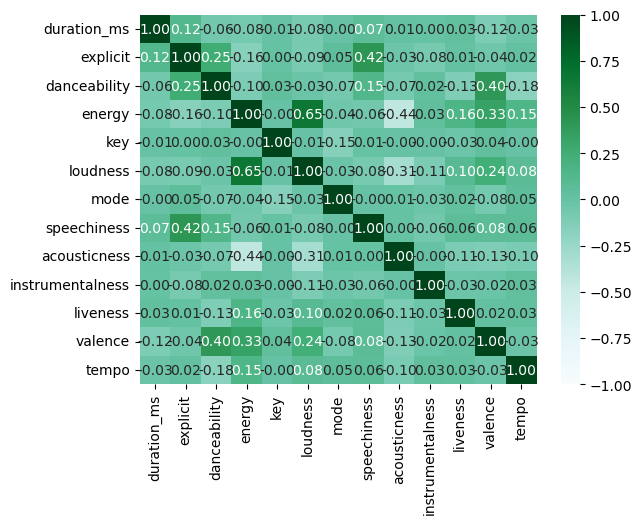

In [13]:
df_subset = df.drop(['popularity', 'genre',], axis=1)
melted_df = df.melt(var_name='feature', value_name='value')
corr_matrix = df_subset.corr()
sns.heatmap(corr_matrix, cmap='BuGn', annot=True, fmt='.2f', center=0, vmin=-1, vmax=1)

In [17]:
scaler = MinMaxScaler()
data[['duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']] = scaler.fit_transform(data[['duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']])
data

,duration_ms,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,...,country,Folk/Acoustic,classical,jazz,rock,World/Traditional,blues,R&B,hip hop,genre_new
0,0.264478,0.0,4,0.735225,0.825230,0.090909,0.744639,0.0,0.037084,0.307363,...,0,0,0,0,0,0,0,0,0,"0,0,0,0,1,0,0,0,0,0,0,0,0,0"
1,0.145673,0.0,4,0.360520,0.891961,0.000000,0.770630,1.0,0.046310,0.010534,...,0,0,0,0,1,0,0,0,0,"0,0,0,0,1,0,0,0,0,1,0,0,0,0"
2,0.370598,0.0,4,0.472813,0.467217,0.636364,0.568584,1.0,0.010492,0.177238,...,1,0,0,0,0,0,0,0,0,"0,0,0,0,1,1,0,0,0,0,0,0,0,0"
3,0.300402,0.0,4,0.498818,0.908908,0.000000,0.812877,0.0,0.042330,0.026928,...,0,0,0,0,1,0,0,0,0,"0,1,0,0,0,0,0,0,0,1,0,0,0,0"
4,0.235918,0.0,4,0.573286,0.924796,0.727273,0.776164,0.0,0.051375,0.041784,...,0,0,0,0,0,0,0,0,0,"0,0,0,0,1,0,0,0,0,0,0,0,0,0"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.183286,0.0,4,0.842790,0.719309,0.090909,0.763366,0.0,0.064399,0.043731,...,0,0,0,0,0,0,0,0,0,"0,0,0,0,1,0,0,0,0,0,0,0,0,0"
1996,0.176281,0.0,4,0.500000,0.685415,0.818182,0.731643,1.0,0.242041,0.119860,...,0,0,0,0,0,0,0,0,0,"0,0,0,0,1,0,0,0,0,0,0,0,0,0"
1997,0.236007,0.0,4,0.848700,0.659994,0.818182,0.586965,1.0,0.155210,0.068527,...,1,0,0,0,0,0,0,0,1,"0,0,0,0,0,1,0,0,0,0,0,0,0,1"
1998,0.156351,0.0,4,0.723404,0.492638,0.727273,0.642405,1.0,0.076700,0.461055,...,0,0,0,0,0,0,0,0,0,"0,0,0,0,1,0,0,0,0,0,0,0,0,0"


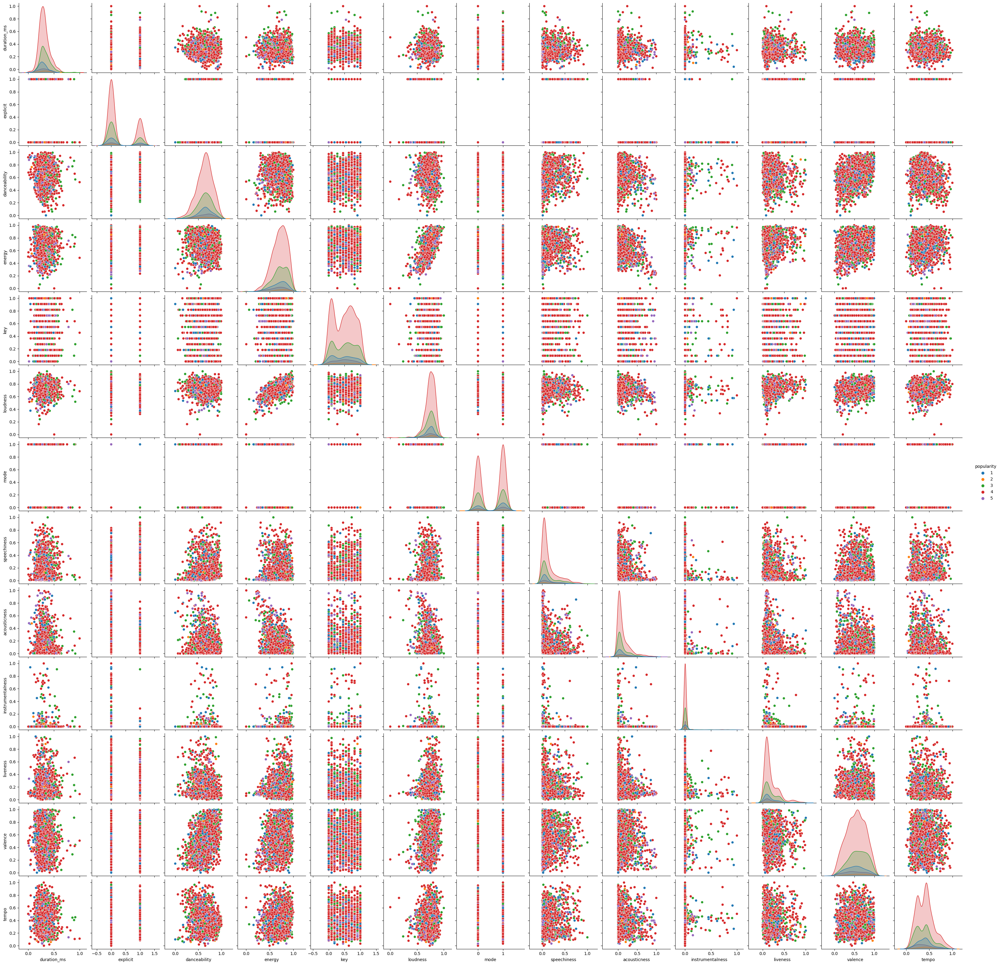

In [19]:
features = ['duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'popularity']
data_subset = data[features]
corr_matrix = data_subset.corr(numeric_only=True)
sns.pairplot(data_subset, hue="popularity")

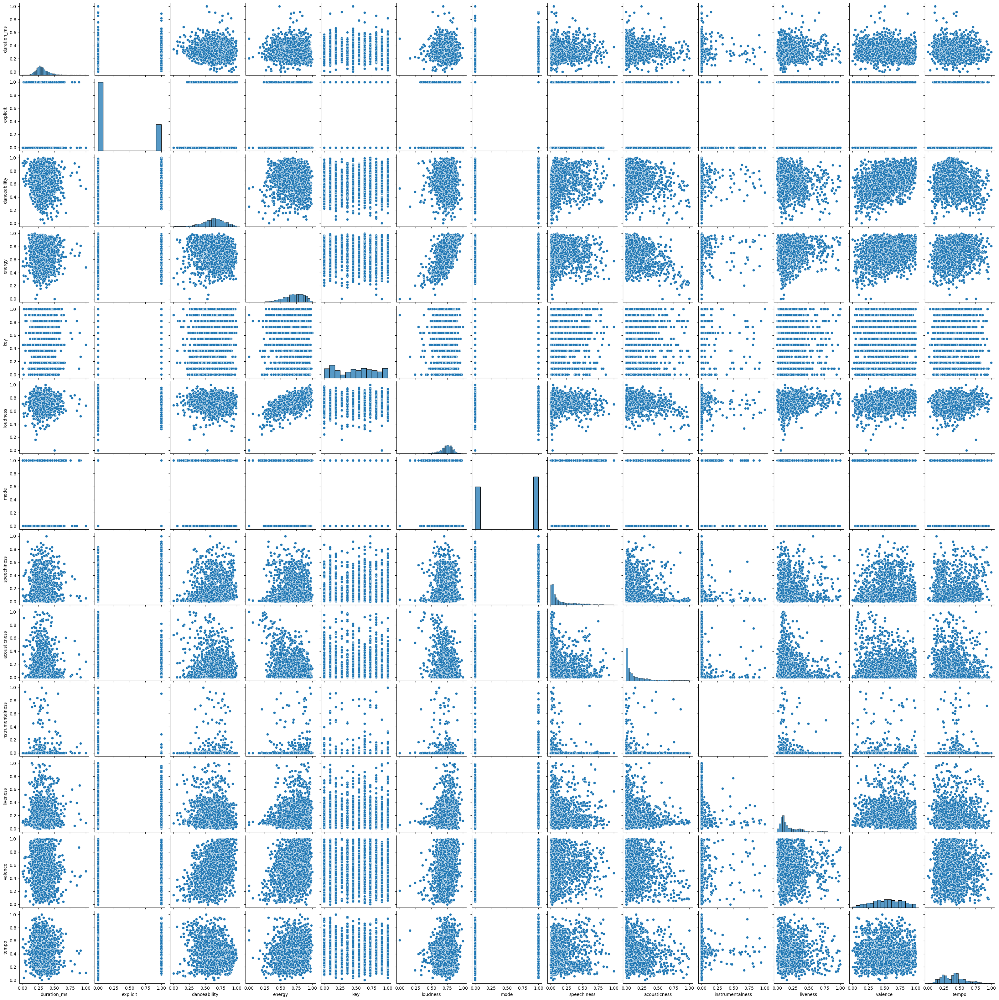

In [126]:
sns.pairplot(data_subset)

In [152]:
data2= data.drop(['genre', 'R&B',
       'Folk/Acoustic', 'World/Traditional', 'metal', 'latin', 'pop', 'rock',
       'Dance/Electronic', 'hip hop', 'blues', 'easy listening', 'country',
       'jazz', 'classical', 'genre_new'], axis=1)

In [153]:
train_data, eval_test_data = train_test_split(data2, test_size=0.2, random_state=42)
eval_data, test_data = train_test_split(eval_test_data, test_size=0.5, random_state=42)

In [154]:
print("Number of samples in training set: ", len(train_data))
print("Number of samples in evaluation set: ", len(eval_data))
print("Number of samples in testing set: ", len(test_data))

Number of samples in training set:  1582
Number of samples in evaluation set:  198
Number of samples in testing set:  198


In [155]:
train_X = train_data.drop('popularity', axis=1)
train_y = train_data['popularity']
test_X = test_data.drop('popularity', axis=1)
test_y = test_data['popularity']

In [156]:
dtc = DecisionTreeClassifier()
dtc_scores = cross_val_score(dtc, train_X, train_y, cv=5)
dtc_mean_score = dtc_scores.mean()

In [157]:
rfc = RandomForestClassifier()
rfc_scores = cross_val_score(rfc, train_X, train_y, cv=5)
rfc_mean_score = rfc_scores.mean()

In [158]:
knn = KNeighborsClassifier()
knn_scores = cross_val_score(knn, train_X, train_y, cv=5)
knn_mean_score = knn_scores.mean()

In [159]:
svm = SVC()
svm_scores = cross_val_score(svm, train_X, train_y, cv=5)
svm_mean_score = svm_scores.mean()

In [160]:
print("Decision Tree mean accuracy score:", dtc_mean_score)
print("Random Forest mean accuracy score:", rfc_mean_score)
print("K-Nearest Neighbor mean accuracy score:", knn_mean_score)
print("Support Vector Machine mean accuracy score:", svm_mean_score)

Decision Tree mean accuracy score: 0.457015932595935
Random Forest mean accuracy score: 0.6068222657029909
K-Nearest Neighbor mean accuracy score: 0.5195883081100507
Support Vector Machine mean accuracy score: 0.6087229964461127


In [161]:
dtc.fit(train_X, train_y)
y_pred1 = dtc.predict(test_X)
cm1 = confusion_matrix(test_y, y_pred1)

rfc.fit(train_X, train_y)
y_pred2 = rfc.predict(test_X)
cm2 = confusion_matrix(test_y, y_pred2)

knn.fit(train_X, train_y)
y_pred3 = knn.predict(test_X)
cm3 = confusion_matrix(test_y, y_pred3)

svm.fit(train_X, train_y)
y_pred4 = svm.predict(test_X)
cm4 = confusion_matrix(test_y, y_pred4)
print("Confusion matrix for the DecisionTreeClassifier model:")
print(cm1)
print("Confusion matrix for the RandomForestClassifier model:")
print(cm2)
print("Confusion matrix for the KNeighborsClassifier model:")
print(cm3)
print("Confusion matrix for the SVC model:")
print(cm4)

Confusion matrix for the DecisionTreeClassifier model:
[[ 3  0  7  7  1]
 [ 1  1  1  3  0]
 [ 4  0 12 34  0]
 [12  2 18 71  9]
 [ 4  0  1  7  0]]
Confusion matrix for the RandomForestClassifier model:
[[  0   0   0  18   0]
 [  0   0   1   5   0]
 [  0   0   3  47   0]
 [  0   0   1 111   0]
 [  0   0   1  11   0]]
Confusion matrix for the KNeighborsClassifier model:
[[ 0  0  4 14  0]
 [ 1  0  1  4  0]
 [ 2  0  7 41  0]
 [ 4  0 23 85  0]
 [ 1  0  2  9  0]]
Confusion matrix for the SVC model:
[[  0   0   0  18   0]
 [  0   0   0   6   0]
 [  0   0   0  50   0]
 [  0   0   0 112   0]
 [  0   0   0  12   0]]


In [166]:
best_model = max([dtc_mean_score, rfc_mean_score, knn_mean_score, svm_mean_score])
if best_model == dtc_mean_score:
    model = dtc
    model_name = "Decision Tree"
elif best_model == rfc_mean_score:
    model = rfc
    model_name = "Random Forest"
elif best_model == knn_mean_score:
    model = knn
    model_name = "K-Nearest Neighbor"
else:
    model = svm
    model_name = "Support Vector Machine"

In [167]:
model.fit(train_X, train_y)
predictions = model.predict(test_X)
conf_matrix = confusion_matrix(test_y, predictions)
print(model_name, "confusion matrix:")
print(conf_matrix)

Support Vector Machine confusion matrix:
[[  0   0   0  18   0]
 [  0   0   0   6   0]
 [  0   0   0  50   0]
 [  0   0   0 112   0]
 [  0   0   0  12   0]]


In [195]:
wrong_predictions = test_data[predictions != test_y].copy()
wrong_predictions.loc[:, 'predicted_popularity'] = predictions[predictions != test_y]


In [194]:
print("Instances predicted wrongly by the", model_name, "model:")
print(wrong_predictions)

Instances predicted wrongly by the Support Vector Machine model:
      duration_ms  explicit popularity  danceability    energy       key  \
790      0.406632       1.0          3      0.671395  0.852770  1.000000   
1745     0.266814       1.0          1      0.728132  0.569961  0.727273   
1013     0.225068       0.0          3      0.756501  0.918441  0.090909   
986      0.392730       1.0          3      0.356974  0.888783  0.454545   
261      0.440185       0.0          2      0.334515  0.648342  0.545455   
...           ...       ...        ...           ...       ...       ...   
370      0.232577       0.0          3      0.375887  0.615507  0.454545   
1648     0.259803       0.0          1      0.715130  0.839000  1.000000   
532      0.234552       0.0          3      0.606383  0.843237  0.545455   
1568     0.278381       1.0          5      0.604019  0.725665  0.363636   
1392     0.272346       1.0          1      0.418440  0.864421  0.000000   

      loudness  mode  

In [169]:

genres = data['genre'].str.split(',').explode()
genres = genres.str.strip()
genre_counts = genres.value_counts()
most_frequent_genres = genre_counts[genre_counts == genre_counts.max()].index.tolist()
least_frequent_genres = genre_counts[genre_counts == genre_counts.min()].index.tolist()


print("Most frequent genre(s):", most_frequent_genres)
print("Least frequent genre(s):", least_frequent_genres)

Most frequent genre(s): ['pop']
Least frequent genre(s): ['classical']


In [170]:
num_genres = data['genre'].str.count(',') + 1
max_num_genres = num_genres.max()

print("The highest number of genres for a single song is:", max_num_genres)

The highest number of genres for a single song is: 4


In [171]:
num_genres = data['genre'].str.count(',') + 1
max_index = num_genres.idxmax()
most_variants = data.loc[max_index, 'genre'].split(',')
most_variants = [genre.strip() for genre in most_variants]


print("The song with the most genres is number:", max_index+1)
print("The genre names for this song are:", most_variants)

The song with the most genres is number: 325
The genre names for this song are: ['hip hop', 'pop', 'R&B', 'latin']


In [172]:
p_RnB = (data['genre'].str.contains('R&B')).mean()
p_pop_hip_hop_given_RnB = ((data['genre'].str.contains('pop', case=False)) & (data['genre'].str.contains('hip hop', case=False)) & (data['genre'].str.contains('R&B', case=False))).mean()
p_pop_hip_hop = ((data['genre'].str.contains('pop', case=False)) & (data['genre'].str.contains('hip hop', case=False))).mean()
p_RnB_given_pop_hip_hop = p_pop_hip_hop_given_RnB * p_RnB / p_pop_hip_hop


print("The probability of the song belonging to the R&B genre given that it is placed in both pop and hip hop genres is: P(R&B | pop and hip hop) =", p_RnB_given_pop_hip_hop)

The probability of the song belonging to the R&B genre given that it is placed in both pop and hip hop genres is: P(R&B | pop and hip hop) = 0.09053631147055007


In [173]:
p_RnB = (data['genre'].str.contains('R&B')).mean()
p_two_given_RnB = ((data['genre'].str.count(',') == 1) & (data['genre'].str.contains('R&B', case=False))).mean()
p_two_genres = (data['genre'].str.count(',') == 1).mean()
p_RnB_given_two = p_two_given_RnB * p_RnB / p_two_genres


print("The probability of a song being placed in the R&B genre given that it is labeled with two genres is:", p_RnB_given_two)

The probability of a song being placed in the R&B genre given that it is labeled with two genres is: 0.04798256459101157


In [175]:
genre_onehot = pd.get_dummies(data["genre_new"])
X = data2
y = data["genre_new"]

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=30)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.5, random_state=30)
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
y_pred_val = dt.predict(X_val)
acc_val = accuracy_score(y_val, y_pred_val)
conf_mat_val = confusion_matrix(y_val, y_pred_val)


print("Validation accuracy:", acc_val)
print("Validation confusion matrix:\n", conf_mat_val)


Validation accuracy: 0.19848293299620734
Validation confusion matrix:
 [[2 0 0 ... 0 0 0]
 [0 9 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]]
